<a href="https://colab.research.google.com/github/federicocanzonieri/DeepLearning/blob/main/DeepLearning_4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import torch
import random
import numpy as np

np.random.seed(0)
torch.manual_seed(0)
random.seed(0)

NUM_EPOCHS=10

In [ ]:
!pip install pytorch_lightning

In [ ]:
from torch.utils import data

class PairMNIST(data.Dataset):
  def __init__(self,root,train=True,transform=None,download=True):
    self.mnist=MNIST(root=root,train=train,transform=transform,download=download)

    self.class_to_indices=[np.where(self.mnist.targets==label)[0] for label in range(10)]
    self.generate_pairs()

  def generate_pairs(self):
    self.pair_labels=(np.random.rand(len(self.mnist))>0.5).astype(int)

    self.paired_idx=[]
    for i, l in enumerate(self.pair_labels):
      c1=self.mnist.targets[i].item()
      if l==0:
        j=np.random.choice(self.class_to_indices[c1])
      else:
        diff_class=np.random.choice(list(set(range(10))-{c1}))
        j=np.random.choice(self.class_to_indices[diff_class])
      
      self.paired_idx.append(j)
  
  def __len__(self):
    return len(self.mnist)

  def __getitem__(self,i):
    im1,l1=self.mnist[i]
    im2,l2=self.mnist[self.paired_idx[i]]
    l=self.pair_labels[i]

    return im1,im2,l,l1,l2




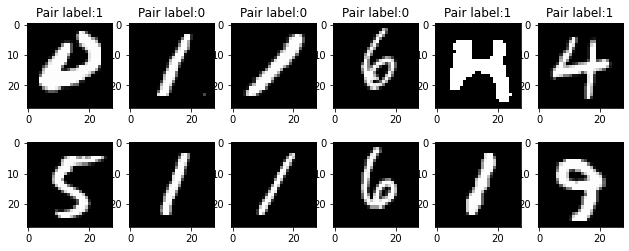

In [ ]:
from matplotlib import pyplot as plt
from torchvision.datasets import MNIST
pair_mnist_train=PairMNIST('mnist',train=True)
plt.figure(figsize=(18,4))
for ii,i in enumerate(np.random.choice(range(len(pair_mnist_train)),6)):
  plt.subplot(2,10,ii+1)
  # print(pair_mnist_train[i][2])
  plt.title('Pair label:'+str(pair_mnist_train[i][2]))
  plt.imshow(pair_mnist_train[i][0],cmap='gray')
  plt.subplot(2,10,ii+11)
  plt.imshow(pair_mnist_train[i][1],cmap='gray')

plt.show()

In [ ]:
from torch import nn
class EmbeddingNet(nn.Module):
  def __init__(self):
    super(EmbeddingNet,self).__init__()
    self.convnet=nn.Sequential(nn.Conv2d(1,32,5),
                               nn.ReLU(),
                               nn.MaxPool2d(2,stride=2),
                               nn.BatchNorm2d(32),
                               nn.Conv2d(32,64,5),
                               nn.ReLU(),
                               nn.MaxPool2d(2,stride=2),
                               )
    self.fc=nn.Sequential(nn.BatchNorm1d(64*4*4),
                          nn.Linear(64*4*4,256),
                          nn.ReLU(),
                          nn.BatchNorm1d(256),
                          nn.Linear(256,128))
    
  def forward(self,x):
    output=self.convnet(x)
    output=output.view(output.size()[0],-1)
    output=self.fc(output)
    return output
    

In [ ]:
model=EmbeddingNet()

model(torch.zeros(16,1,28,28)).shape


torch.Size([16, 128])

In [ ]:
from torch.nn import functional as F
class ContrastiveLoss(torch.nn.Module):
  def __init__(self,m=2):
    super(ContrastiveLoss,self).__init__()
    self.m=m
  
  def forward(self,phi_i,phi_j,l_ij):
    d=F.pairwise_distance(phi_i,phi_j)
    l= 0.5*(1-l_ij.float())* torch.pow(d,2)+ 0.5*l_ij.float()*torch.pow(torch.clamp(self.m-d,min=0),2)
    return l.mean()
    

In [ ]:
import pytorch_lightning as pl
import itertools
from torch.utils.data import DataLoader 
import torchvision 
from torch.optim import  SGD

class SiameseNetworkTask(pl.LightningModule):
  def __init__(self,
               embedding_net,
               lr=0.01,
               momentum=0.99,
               margin=2
               ):
    super(SiameseNetworkTask,self).__init__()
    self.save_hyperparameters()
    self.embedding_net=embedding_net
    self.criterion=ContrastiveLoss(margin)

  def forward(self,x):
    return self.model(x)

  def configure_optimizers(self):
    return SGD(self.embedding_net.parameters(),self.hparams.lr,momentum=self.hparams.momentum)


  def training_step(self,batch,batch_idx):
    
    I_i,I_j,l_ij,*_=batch

    phi_i=self.embedding_net(I_i)
    phi_j=self.embedding_net(I_j)

    l=self.criterion(phi_i,phi_j,l_ij)

    self.log('train/loss',l)
    return l


  def validation_step(self,batch,batch_idx):
    I_i,I_j,l_ij,*_=batch

    phi_i=self.embedding_net(I_i)
    phi_j=self.embedding_net(I_j)
    l=self.criterion(phi_i,phi_j,l_ij)
    self.log('valid/loss',l)

    # if batch_idx==0:
    #   self.logger.experiment.add_embedding(phi_i,batch[3],I_i,global_step=self.global_step)

    

In [ ]:
from torch.utils.data import DataLoader
from torchvision import transforms

transform=transforms.Compose([transforms.ToTensor(),
                              transforms.Normalize((0.1307),(0.3081,))])

pair_mnist_train=PairMNIST(root='mnist',train=True,download=True,transform=transform)
pair_mnist_test=PairMNIST(root='mnist',train=False,download=True,transform=transform)

pair_mnist_train_loader=DataLoader(pair_mnist_train,batch_size=1024,num_workers=8,shuffle=True)
pair_mnist_test_loader=DataLoader(pair_mnist_test,batch_size=1024,num_workers=8)


In [ ]:
%load_ext tensorboard
%tensorboard --logdir metric_logs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [ ]:
from pytorch_lightning.loggers import TensorBoardLogger

siamese_mnist_task=SiameseNetworkTask(EmbeddingNet())
logger=TensorBoardLogger('metric_logs',name='siamese_mnist')
trainer=pl.Trainer(gpus=0,logger=logger,max_epochs=2,enable_progress_bar=True)

trainer.fit(siamese_mnist_task,pair_mnist_train_loader,pair_mnist_test_loader)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:685: UserWarning: Detected KeyboardInterrupt, attempting graceful shutdown...
  rank_zero_warn("Detected KeyboardInterrupt, attempting graceful shutdown...")


In [ ]:
def extract_representations(model,loader):
  device='cuda' if torch.cuda.is_available() else 'cpu'
  model.eval()
  model.to(device)
  repres,labels=[],[]
  for batch in loader:
    x=batch[0].to(device)
    rep=model(x)
    rep=rep.detach().to('cpu').numpy()
    labels.append(batch[1])
    repres.append(rep)

  return np.concatenate(repres),np.concatenate(labels)


In [ ]:
transform=transforms.Compose([transforms.ToTensor(),
                              transforms.Normalize((0.1307),(0.3081))])

mnist_test_loader=DataLoader(MNIST(root='mnist',train=False,download=True,transform=transform),num_workers=8,batch_size=1024)
mnist_test_repres,mnist_test_labels=extract_representations(siamese_mnist_task.embedding_net,mnist_test_loader)


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


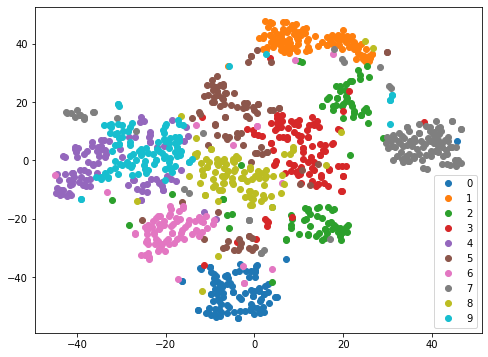

In [ ]:
from sklearn.manifold import TSNE
from matplotlib import pyplot as plt

selected_rep=np.random.choice(len(mnist_test_repres),1000)
selec_mnist_test_repr=mnist_test_repres[selected_rep]
selected_mnist_test_labels=mnist_test_labels[selected_rep]

tsne=TSNE(2)
rep_tsne=tsne.fit_transform(selec_mnist_test_repr)

plt.figure(figsize=(8,6))
for c in np.unique(selected_mnist_test_labels):
  plt.plot(rep_tsne[selected_mnist_test_labels==c,0],rep_tsne[selected_mnist_test_labels==c,1],'o',label=c)
  
plt.legend()
plt.show()


In [ ]:
class TripletMNIST(data.Dataset):

  def __init__(self,root,train=True,transform=None,download=True):
    self.mnist=MNIST(root=root,train=train,transform=transform,download=download)

    self.class_to_indices=[np.where(self.mnist.targets==label)[0] for label in range(10)]

    self.generate_triplets()

  def generate_triplets(self):

    self.similar_idx=[]
    self.dissimilar_idx=[]
    for i in range(len(self.mnist)):
      c1=self.mnist.targets[i].item()
      j=np.random.choice(self.class_to_indices[c1])
      diff_class=np.random.choice(list(set(range(10))-{c1}))
      k=np.random.choice(self.class_to_indices[diff_class])

      self.similar_idx.append(j)
      self.dissimilar_idx.append(k)

  def __len__(self):
    return len(self.mnist)

  def __getitem__(self,i):

    im1,l1=self.mnist[i]
    im2,l2=self.mnist[self.similar_idx[i]]
    im3,l3=self.mnist[self.dissimilar_idx[i]]

    return im1,im2,im3,l1,l2,l3




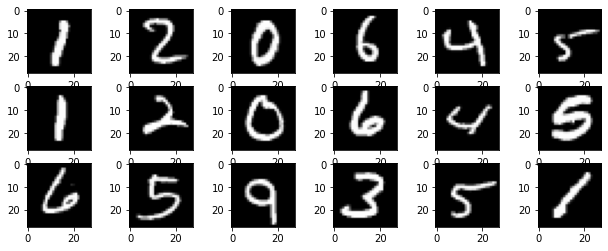

In [ ]:
triplet_mnist_train=TripletMNIST('mnist',train=True)
plt.figure(figsize=(18,4))

for ii, i in enumerate(np.random.choice(range(len(triplet_mnist_train)),6)):
  plt.subplot(3,10,ii+1)
  plt.imshow(triplet_mnist_train[i][0],cmap='gray')
  plt.subplot(3,10,ii+11)
  plt.imshow(triplet_mnist_train[i][1],cmap='gray')
  plt.subplot(3,10,ii+21)
  plt.imshow(triplet_mnist_train[i][2],cmap='gray')
  
plt.show()

In [ ]:
class TripletNetworkTask(pl.LightningModule):
  def __init__(self,
               embedding_net,
               lr=0.01,
               momentum=0.99,
               margin=2,
               ):
    super(TripletNetworkTask,self).__init__()
    self.save_hyperparameters()
    self.embedding_net=embedding_net
    self.criterion=nn.TripletMarginLoss(margin=margin)

  def forward(self,x):
    return self.model(x)

  def configure_optimizers(self):
    return SGD(self.embedding_net.parameters(),self.hparams.lr,momentum=self.hparams.momentum)

  def training_step(self,batch,batch_idx):
    I_i,I_j,I_k,*_=batch

    phi_i=self.embedding_net(I_i)
    phi_j=self.embedding_net(I_j)
    phi_k=self.embedding_net(I_k)

    l=self.criterion(phi_i,phi_j,phi_k)
    self.log('train/loss',l)
    return l


  def validation_step(self,batch,batch_idx):
    I_i,I_j,I_k,*_=batch

    phi_i=self.embedding_net(I_i)
    phi_j=self.embedding_net(I_j)
    phi_k=self.embedding_net(I_k)

    l=self.criterion(phi_i,phi_j,phi_k)
    self.log('valid/loss',l)

    if batch_idx==0:
      self.logger.experiment.add_embedding(phi_i,batch[3],I_i,global_step=self.global_step)



In [ ]:
triplet_mnist_train=TripletMNIST('mnist',train=True,transform=transform)
triplet_mnist_test=TripletMNIST('mnist',train=False,transform=transform)

triplet_mnist_train_loader=DataLoader(triplet_mnist_train,batch_size=1024,shuffle=True,num_workers=8)
triplet_mnist_test_loader=DataLoader(triplet_mnist_test,batch_size=1024,num_workers=8)



/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [ ]:
import tensorflow as tf
import tensorboard as tb
tf.io.gfile = tb.compat.tensorflow_stub.io.gfile

In [ ]:
from pytorch_lightning.loggers import TensorBoardLogger

triplet_mnist_task=TripletNetworkTask(EmbeddingNet())
logger=TensorBoardLogger('metric_logs',name='siamese_triplet')
trainer=pl.Trainer(gpus=0,logger=logger,max_epochs=NUM_EPOCHS,enable_progress_bar=False)

trainer.fit(triplet_mnist_task,triplet_mnist_train_loader,triplet_mnist_test_loader)

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:685: UserWarning: Detected KeyboardInterrupt, attempting graceful shutdown...
  rank_zero_warn("Detected KeyboardInterrupt, attempting graceful shutdown...")


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


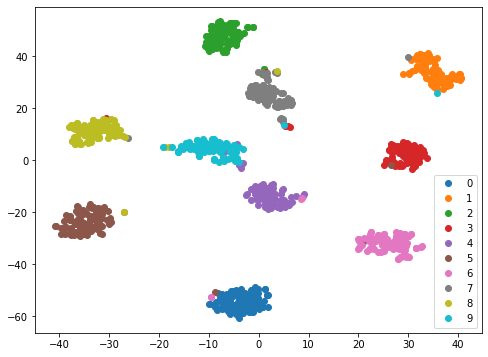

In [ ]:
mnist_test_repr,mnist_test_labels=extract_representations(triplet_mnist_task.embedding_net,mnist_test_loader)
selected_rep=np.random.choice(len(mnist_test_repr),1000)
selected_mnist_test_repr=mnist_test_repr[selected_rep]

selected_mnist_test_labels=mnist_test_labels[selected_rep]

tsne=TSNE(2)
rep_tsne=tsne.fit_transform(selected_mnist_test_repr)

plt.figure(figsize=(8,6))
for c in np.unique(selected_mnist_test_labels):
  plt.plot(rep_tsne[selected_mnist_test_labels==c,0],rep_tsne[selected_mnist_test_labels==c,1],'o',label=c)

plt.legend()
plt.show()


In [ ]:
!wget https://iplab.dmi.unict.it/EgocentricShoppingCartLocalization/egocart.zip

egocart.zip         100%[===================>]   2.52G  23.6MB/s    in 1m 54s  

2021-11-28 12:52:14 (22.6 MB/s) - ‘egocart.zip’ saved [2708654783/2708654783]



In [ ]:
!unzip egocart.zip -d egocart

Output streaming troncato alle ultime 5000 righe.
  inflating: egocart/train_set/train_RGB/4L070320.jpg  
  inflating: egocart/train_set/train_RGB/4L070340.jpg  
  inflating: egocart/train_set/train_RGB/4L070360.jpg  
  inflating: egocart/train_set/train_RGB/4L070380.jpg  
  inflating: egocart/train_set/train_RGB/4L070400.jpg  
  inflating: egocart/train_set/train_RGB/4L070420.jpg  
  inflating: egocart/train_set/train_RGB/4L070440.jpg  
  inflating: egocart/train_set/train_RGB/4L070460.jpg  
  inflating: egocart/train_set/train_RGB/4L070480.jpg  
  inflating: egocart/train_set/train_RGB/4L070500.jpg  
  inflating: egocart/train_set/train_RGB/4L070520.jpg  
  inflating: egocart/train_set/train_RGB/4L070540.jpg  
  inflating: egocart/train_set/train_RGB/4L070560.jpg  
  inflating: egocart/train_set/train_RGB/4L070580.jpg  
  inflating: egocart/train_set/train_RGB/4L070600.jpg  
  inflating: egocart/train_set/train_RGB/4L070620.jpg  
  inflating: egocart/train_set/train_RGB/4L070640.jpg 

In [ ]:
from os.path import join
import numpy as np
from PIL import Image


class EgoCart(data.Dataset):
  def __init__(self,root,mode='train',transform=None):
    self.root=join(root,f"{mode}_set",f"{mode}_RGB")
    self.transform=transform

    labs=np.loadtxt(join(root,f"{mode}_set",f"{mode}_set.txt"),dtype=str)
    self.image_names=labs[:,0]
    self.xy=labs[:,2:4].astype(float)
    self.uv=labs[:,4:6].astype(float)

    self.uv/=np.linalg.norm(self.uv,axis=1).reshape(-1,1)

  def __len__(self):
    return len(self.image_names)

  def __getitem__(self,i):
    im=Image.open(join(self.root,self.image_names[i]))
    if self.transform is not None:
      im = self.transform(im)
    return im,self.xy[i],self.uv[i]
    

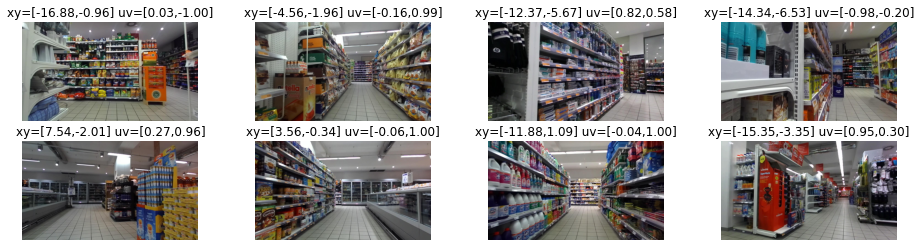

In [ ]:
egocart_train=EgoCart(root='egocart')
plt.figure(figsize=(16,4))

for i,idx in enumerate(np.random.choice(len(egocart_train),8)):
  im,xy,uv=egocart_train[idx]
  plt.subplot(2,4,i+1)
  plt.imshow(im)
  plt.axis('off')
  plt.title('xy=[{x:0.2f},{y:0.2f}] uv=[{u:0.2f},{v:0.2f}]'.format(x=xy[0],y=xy[1],u=uv[0],v=uv[1]))

plt.show()

In [ ]:
from tqdm import tqdm

def extract_rgb_repr(loader):
  repr,xy,uv=[],[],[]
  for batch in tqdm(loader, total=len(loader)):
    repr.append(batch[0].view(batch[0].shape[0],-1).numpy())
    xy.append(batch[1])
    uv.append(batch[2])

  return np.concatenate(repr),np.concatenate(xy),np.concatenate(uv)

In [ ]:
egocart_train_loader=DataLoader(EgoCart(root='egocart',mode='train',
                                        transform=transforms.Compose([
                                                  transforms.Resize(32),
                                                  transforms.ToTensor(),
                                                  transforms.Normalize(mean=[0.485,0.456,0.406],std=[0.229,0.224,0.225])
                                        ])),shuffle=True,num_workers=8,batch_size=32)


egocart_test_loader=DataLoader(EgoCart(root='egocart',mode='test',
                                        transform=transforms.Compose([
                                                  transforms.Resize(32),
                                                  transforms.ToTensor(),
                                                  transforms.Normalize(mean=[0.485,0.456,0.406],std=[0.229,0.224,0.225])
                                        ])),num_workers=8,batch_size=32)




/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [ ]:
egocart_train_representation_rgb, egocart_train_xy, egocart_train_uv=extract_rgb_repr(egocart_train_loader)
egocart_test_representation_rgb, egocart_test_xy, egocart_test_uv=extract_rgb_repr(egocart_test_loader)


  0%|          | 0/418 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
100%|██████████| 193/193 [01:27<00:00,  2.20it/s]


In [ ]:
egocart_train_representations_rgb.shape

In [ ]:
!pip install faiss-cpu

     |████████████████████████████████| 8.4 MB 5.0 MB/s 


In [ ]:
import faiss 
def predict_nn(train_rep,test_rep,train_xy,train_uv):
  index=faiss.IndexFlatL2(train_rep.shape[1])
  index.add(train_rep.astype(np.float32))

  indices=np.array([index.search(x.reshape(1,-1).astype(np.float32),k=1)[1][0][0] for x in test_rep])

  return train_xy[indices].squeeze(), train_uv[indices].squeeze()


In [ ]:
egocart_pred_test_xy_rgb,egocart_pred_test_uv_rgb=predict_nn(egocart_train_representation_rgb,egocart_test_representation_rgb,egocart_train_xy,egocart_train_uv)

In [ ]:
def evaluate_localization(pred_xy,pred_uv,gt_xy,gt_uv):
  position_error=np.sqrt(((pred_xy-gt_xy)**2).sum(1)).mean()
  orientation_error=np.rad2deg(np.arccos((gt_uv*pred_uv).sum(1))).mean()
  return position_error,orientation_error
  

In [ ]:
pos_error,orient_error=evaluate_localization(egocart_pred_test_xy_rgb,egocart_pred_test_uv_rgb,egocart_test_xy,egocart_test_uv)
print(f"Pos error",pos_error)
print(f"Orien error",orient_error)

In [ ]:
from torchvision.models import mobilenet_v2

base_model=mobilenet_v2()


In [ ]:
base_model.classifier= nn.Identity()
base_model(torch.zeros(1,3,224,224)).shape)

In [ ]:
from tqdm import tqdm

def extract_representation(model,loader):
  device= 'cuda' if torch.cuda.is_avaialable() else 'cpu'
  model.eval()
  model.to(device)
  repres,xy,uv=[],[],[]
  for batch in tqdm(loader,total=len(loader)):
    x=batch[0].to(device)
    rep=model(x)
    rep=rep.detach().to('cpu').numpy()
    xy.append(batch[1])
    uv.append(batch[2])
    repres.append(rep)
  return np.concatenate(repres),np.concatenate(xy),np.concatenate(uv)
  

In [ ]:
egocart_train_loader= DataLoader(EgoCart(root='egocart',mode='train',
                                         transform=transforms.Compose([
                                            transforms.Resize(224),
                                            transforms.ToTensor(),
                                            transforms.Normalize(mean=[0.485,0.456,0.406],std=[0.229,0.224,0.225])
                                         ])),shuffle=True,num_workers=8,batch_size=32)

egocart_test_loader= DataLoader(EgoCart(root='egocart',mode='test',
                                         transform=transforms.Compose([
                                            transforms.Resize(224),
                                            transforms.ToTensor(),
                                            transforms.Normalize(mean=[0.485,0.456,0.406],std=[0.229,0.224,0.225])
                                         ])),shuffle=True,num_workers=8,batch_size=32)



In [ ]:
egocart_train_repres_base, egocart_train_xy,egocart_train_uv= extract_representations(base_model,egocart_train_loader)

pos_error,orient_error=evaluate_localization(egocart_pred_test_xy_base, egocart_pred_test_uv_base, egocart_test_xy,egocart_test_uv)
print(pos_error,orient_error)


In [ ]:
CONTINUAREEEEEEEEEEEEEEEEEEEEEEEEe